In [1]:
import pandas as pd
import json
import matplotlib.pyplot as plt

In [2]:
with open('data/basic_data.jsonl', "r") as f:
    data = "[" + ",".join(f.readlines()) + "]"
data = json.loads(data)
data

[{'cluster_id': 84872,
  'key_concepts': ['historical performance practice',
   'Don Juan',
   'Baroque music',
   'English virginal music',
   'English Baroque performance'],
  'num_recent_articles': 228,
  'cluster_category': 'humanities',
  'growth_rating': 15.43,
  'x': -90.2114,
  'y': -71.396},
 {'cluster_id': 72062,
  'key_concepts': ['Early Modern Art',
   'John Singleton Copley',
   'Scottish National Portrait',
   'National Portrait Gallery',
   'Ingres'],
  'num_recent_articles': 239,
  'cluster_category': 'humanities',
  'growth_rating': 3.22,
  'x': -76.1376,
  'y': -37.2588},
 {'cluster_id': 62380,
  'key_concepts': ['Malay gamelan music',
   'folk music',
   'Music Theory',
   'Folk music quotations',
   'Debussy'],
  'num_recent_articles': 283,
  'cluster_category': 'humanities',
  'growth_rating': 33.33,
  'x': -160.446,
  'y': 20.6144},
 {'cluster_id': 65319,
  'key_concepts': ['Rite of Spring',
   'Indonesian piano music',
   'piano music',
   'Ballets Russes company

In [3]:
len(data)

85643

In [8]:
nums = [pt["num_recent_articles"] for pt in data]
min(nums), max(nums)

(1, 19914)

<AxesSubplot:>

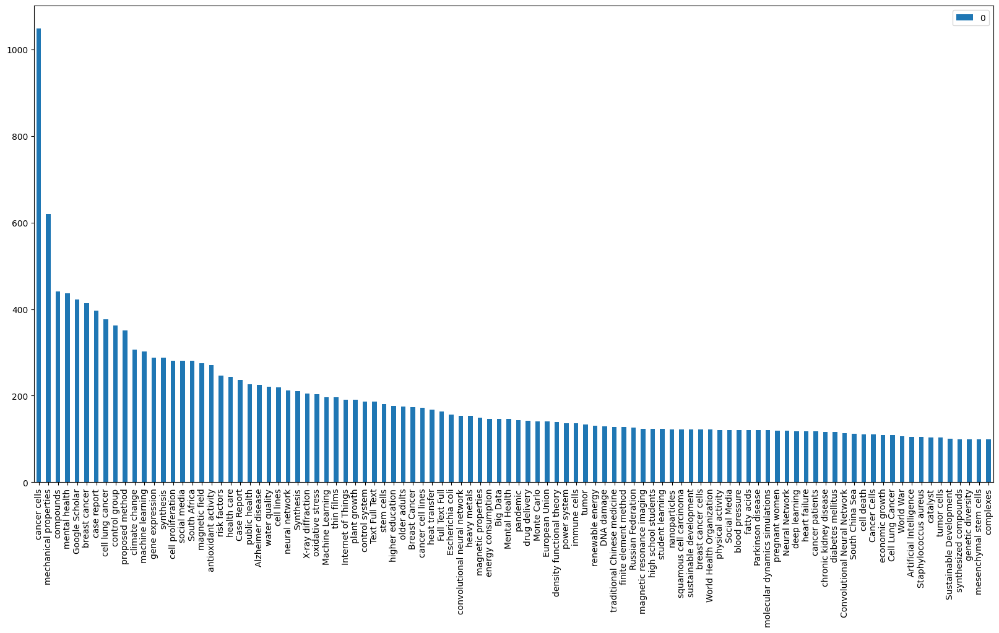

In [5]:
dict_ = {}
a = {}
for data_point in data:
    keys = data_point.get('key_concepts')
    if keys is None:
        keys = []
    
    for key in keys:
        dict_[key] = dict_.get(key, 0) + 1

df = pd.DataFrame(dict_, index=[0]).T.sort_values(0, ascending=False)
df[:100].plot(kind='bar', figsize=(20, 10))

humanities
biology
earth science
physics
social science
medicine
chemistry
engineering
mathematics
computer science
materials science


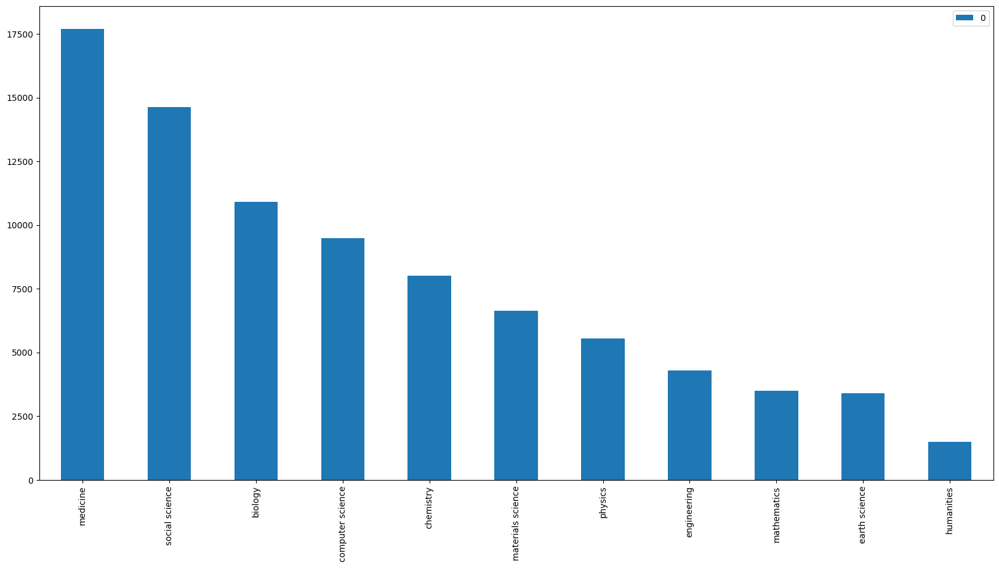

In [6]:
cats = {}
for data_point in data:
    cat = data_point.get('cluster_category')

    cats[cat] = cats.get(cat, 0) + 1

df = pd.DataFrame(cats, index=[0]).T.sort_values(0, ascending=False)
df.plot(kind='bar', figsize=(20, 10))

for cat in cats.keys():
    print(cat)

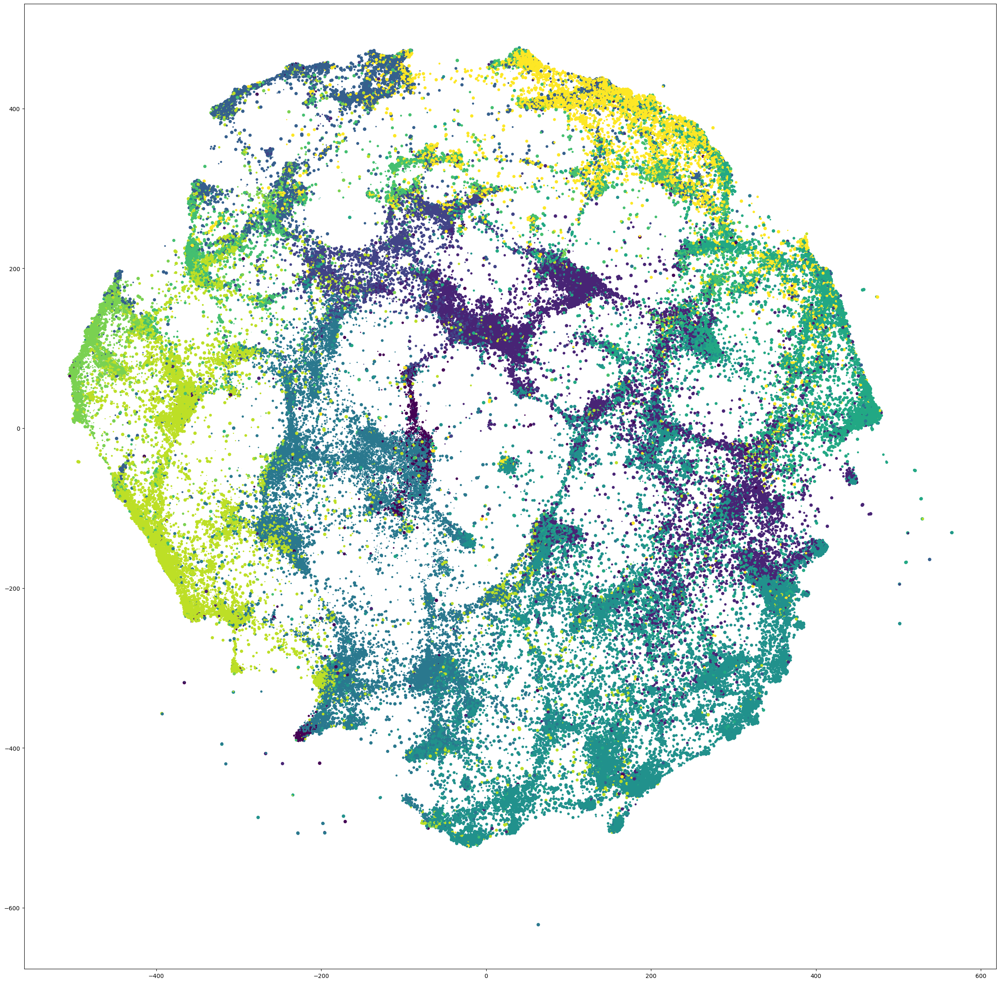

In [7]:
points = [(dp["x"], dp["y"], dp["growth_rating"], dp["cluster_category"] ) for dp in data]

def get_color(cat):
    if cat == "humanities":
        return 0
    elif cat == "biology":
        return 1
    elif cat == "earth science":
        return 2
    elif cat == "physics":
        return 3
    elif cat == "social science":
        return 4
    elif cat == "medicine":
        return 5
    elif cat == "chemistry":
        return 6
    elif cat == "engineering":
        return 7
    elif cat == "mathematics":
        return 8
    elif cat == "computer science":
        return 9
    elif cat == "materials science":
        return 10
    else:
        return 11

x, y, growth, cat = zip(*points)
cat = [get_color(c) for c in cat]

plt.figure(figsize=(30, 30))
plt.scatter(x, y, s=growth, c=cat, cmap='viridis', marker='.')


In [8]:
min(growth), max(growth)

(0.0, 100.0)

In [9]:
min(x), max(x)

(-506.5102, 564.9596)

In [10]:
min(y), max(y)

(-621.5022, 475.9544)

# Plotly

In [11]:
import plotly.express as px
df = px.data.gapminder()

fig = px.scatter(df.query("year==2007"), x="gdpPercap", y="lifeExp",
	         size="pop", color="continent",
                 hover_name="country", log_x=True, size_max=60)
fig.show()

In [12]:
with open('data/basic_data.jsonl', "r") as f:
    data = "[" + ",".join(f.readlines()) + "]"
data = json.loads(data)
data

[{'cluster_id': 84872,
  'key_concepts': ['historical performance practice',
   'Don Juan',
   'Baroque music',
   'English virginal music',
   'English Baroque performance'],
  'num_recent_articles': 228,
  'cluster_category': 'humanities',
  'growth_rating': 15.43,
  'x': -90.2114,
  'y': -71.396},
 {'cluster_id': 72062,
  'key_concepts': ['Early Modern Art',
   'John Singleton Copley',
   'Scottish National Portrait',
   'National Portrait Gallery',
   'Ingres'],
  'num_recent_articles': 239,
  'cluster_category': 'humanities',
  'growth_rating': 3.22,
  'x': -76.1376,
  'y': -37.2588},
 {'cluster_id': 62380,
  'key_concepts': ['Malay gamelan music',
   'folk music',
   'Music Theory',
   'Folk music quotations',
   'Debussy'],
  'num_recent_articles': 283,
  'cluster_category': 'humanities',
  'growth_rating': 33.33,
  'x': -160.446,
  'y': 20.6144},
 {'cluster_id': 65319,
  'key_concepts': ['Rite of Spring',
   'Indonesian piano music',
   'piano music',
   'Ballets Russes company

In [19]:
df = pd.DataFrame(data)
# df.drop("key_concepts", axis=1, inplace=True)
df

,cluster_id,key_concepts,num_recent_articles,cluster_category,growth_rating,x,y
0,84872,"[historical performance practice, Don Juan, Ba...",228,humanities,15.43,-90.2114,-71.3960
1,72062,"[Early Modern Art, John Singleton Copley, Scot...",239,humanities,3.22,-76.1376,-37.2588
2,62380,"[Malay gamelan music, folk music, Music Theory...",283,humanities,33.33,-160.4460,20.6144
3,65319,"[Rite of Spring, Indonesian piano music, piano...",242,humanities,3.11,-78.1228,-68.1877
4,72024,"[Mediterranean Marine Caves, Marine Caves, mar...",104,biology,74.75,-45.6533,178.6693
...,...,...,...,...,...,...,...
85638,6047,"[Tissue Engineering, cell culture, Cell Cultur...",686,materials science,52.10,320.7678,181.4553
85639,129,"[graphene oxide, Reduced Graphene, Functionali...",1982,materials science,33.59,230.4844,350.5407
85640,41756,"[OLED display, crystalline oxide semiconductor...",376,materials science,44.26,168.4628,392.2027
85641,213,"[chemical vapor deposition, CVD graphene films...",1651,materials science,19.63,98.1491,416.9048


In [26]:
fig = px.scatter(df, x="x", y="y",
	         size="growth_rating", color="cluster_category",
                 hover_name="cluster_id", log_x=False, size_max=6, width=2000, height=1000)
fig.show()

In [34]:
with open('data/data_obj.json', "r") as f:
    data0 = json.load(f)

for key in data0.keys():
    print(key)
    for key0 in data0[key].keys():
        print("\t", key0)

cluster_id_to_idx
	 84872
	 72062
	 62380
	 65319
	 72024
	 72037
	 65522
	 73414
	 38456
	 78478
	 85621
	 80969
	 65326
	 54541
	 72928
	 52466
	 74530
	 51584
	 32216
	 82992
	 75105
	 68451
	 43145
	 64440
	 52181
	 49385
	 64485
	 81062
	 73385
	 53131
	 79072
	 72877
	 43416
	 76745
	 25984
	 81246
	 43214
	 70875
	 53133
	 64428
	 76459
	 64866
	 73217
	 17942
	 56485
	 76002
	 77018
	 80275
	 77044
	 69716
	 36995
	 62481
	 69594
	 74845
	 68994
	 71353
	 28143
	 75174
	 62813
	 61524
	 75785
	 61705
	 48076
	 56359
	 67939
	 50253
	 55926
	 80369
	 53388
	 79935
	 75331
	 71902
	 64050
	 58605
	 82631
	 5332
	 65129
	 78457
	 79821
	 83122
	 49510
	 48031
	 70026
	 37436
	 84655
	 82769
	 85118
	 86346
	 82281
	 63846
	 74661
	 70207
	 82436
	 22580
	 50201
	 32740
	 69785
	 63197
	 70637
	 76795
	 72142
	 43002
	 68458
	 64950
	 53291
	 66737
	 47163
	 29720
	 48478
	 46000
	 83390
	 27872
	 74490
	 43191
	 56750
	 55676
	 58986
	 75926
	 65735
	 11518
	 70981
	 30877
	 73618

In [39]:
len(data0["key_to_output_list"]["x"])

85643